In [1]:
cd ../

/Users/sowonjeong/Documents/GitHub/GNN-Geometry


In [2]:
import matplotlib.pyplot as plt
import torch
from models.grace import *
from models.train_models import train_grace
from models.baseline_models import *
from simulation_utils.helix import *
from metrics import *

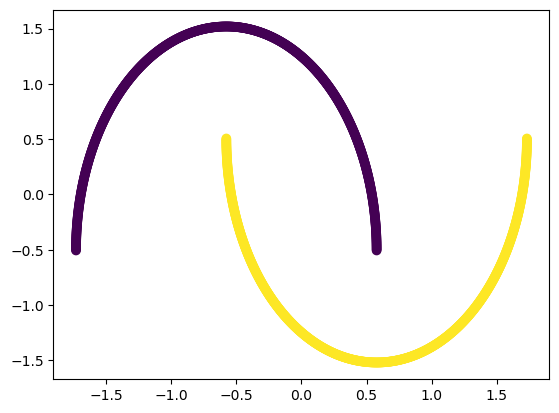

In [3]:
X,c, A, dataset = get_moons(n_samples=1500, shuffle=True, noise=None, random_state= 0,
                        n_neighbours = 5, features = 'coordinates', standardize=True)
plt.scatter(X[:,0], X[:,1], c=c)

In [12]:
exp = 20
circles = {}
for i in range(exp):
    X,c, A, dataset = get_circles(n_samples=1500, shuffle=True, noise=0.1, random_state= i, factor=0.5,
                        n_neighbours = 5, features = 'coordinates', standardize=True, ratio  = 0.8)
    perfect_embedding = X
    alpha = np.arange(0,1.1,0.1)
    for types in ["symmetric","RW"]:
        for j in np.arange(10):
            model = train_grace(dataset, 32, 2, n_layers=1, tau=0.5,
                        epochs=500, wd=1e-3, lr=1e-1, fmr=0.2, edr =0.5,
                        proj="nonlinear-hid", name_file="test", device=None,
                        gnn_type= types, alpha=alpha[j+1], beta = 1,add_self_loops= True)
            out_tmp = model.get_embedding(dataset)
            Y = out_tmp.detach().numpy()
            _,_,cor,_ = spearman_correlation_eval(perfect_embedding, out_tmp)
            knn_eval = neighbor_kept_ratio_eval(dataset,out_tmp, n_neighbors = 5)
            dens = eval_density_preserve(X,Y, sigma = 1.0, min_dist = 1e-3)
            circles[types + '_' + str(alpha[j+1]) + '_' +  str(i)]  =  {'global_m': cor, 'local_m' : knn_eval, 'density': dens,
                                            'seed' : i,
                                            'gnn_type': types,
                                            'embedding' : out_tmp,
                                            'exp number': i,
                                            'alpha': alpha[j+1]}



=== train GRACE model ===
Epoch=000, loss=8.3273
Epoch=001, loss=7.6950
Epoch=002, loss=7.3729
Epoch=003, loss=7.2815
Epoch=004, loss=7.2622
Epoch=005, loss=8.7439
Epoch=006, loss=7.2735
Epoch=007, loss=7.3797
Epoch=008, loss=8.6936
Epoch=009, loss=8.6384
Epoch=010, loss=7.3769
Epoch=011, loss=7.3538
Epoch=012, loss=7.3267
Epoch=013, loss=7.3359
Epoch=014, loss=7.3449
Epoch=015, loss=7.3408
Epoch=016, loss=7.3386
Epoch=017, loss=8.4167
Epoch=018, loss=7.3344
Epoch=019, loss=7.3593
Epoch=020, loss=8.3558
Epoch=021, loss=7.3325
Epoch=022, loss=8.3154
Epoch=023, loss=8.3504
Epoch=024, loss=7.4019
Epoch=025, loss=7.4113
Epoch=026, loss=7.4198
Epoch=027, loss=7.4080
Epoch=028, loss=8.2115
Epoch=029, loss=8.2015
Epoch=030, loss=8.1726
Epoch=031, loss=8.1402
Epoch=032, loss=7.5068
Epoch=033, loss=7.5355
Epoch=034, loss=8.0918
Epoch=035, loss=7.5431
Epoch=036, loss=7.5348
Epoch=037, loss=8.0961
Epoch=038, loss=7.4937
Epoch=039, loss=7.4927
Epoch=040, loss=7.4404
Epoch=041, loss=7.4469
Epoch=04

In [ ]:
import pickle

# Store data 
with open('circle-repeat-0802.pkl', 'wb') as file: # factor = 0.8
    # A new file will be created
    pickle.dump(circles, file)

In [4]:
import pickle

# Store data 
with open('circle-repeat.pkl', 'wb') as file: # factor = 0.8
    # A new file will be created
    pickle.dump(circles, file)

In [ ]:
tab = pd.DataFrame.from_dict(circles).T
tab.groupby(["gnn_type","alpha"])['global_m','local_m','density'].mean()

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_96509/2290380754.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  tab.groupby(["gnn_type","alpha"])['global_m','local_m','density'].mean()


global_m   local_m   density
gnn_type  alpha                              
RW        0.1    0.669981  0.174550  0.658991
          0.2    0.700197  0.202661  0.708260
          0.3    0.670024  0.193709  0.691523
          0.4    0.664442  0.203825  0.691491
          0.5    0.668897  0.224549  0.708381
          0.6    0.685079  0.238442  0.728811
          0.7    0.697742  0.291490  0.761683
          0.8    0.704152  0.331413  0.766098
          0.9    0.660192  0.287491  0.727581
          1.0    0.761967  0.441993  0.826042
symmetric 0.1    0.818937  0.267583  0.782417
          0.2    0.738303  0.224378  0.723832
          0.3    0.719250  0.241094  0.738470
          0.4    0.745046  0.259089  0.758434
          0.5    0.707793  0.265363  0.750789
          0.6    0.703871  0.278938  0.738121
          0.7    0.685728  0.257523  0.719289
          0.8    0.692171  0.292166  0.724525
          0.9    0.664225  0.279405  0.688831
          1.0    0.662905  0.263793  0.681960

In [ ]:
tab.groupby(["gnn_type","alpha"])['global_m','local_m','density'].std()

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_96509/2954017120.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  tab.groupby(["gnn_type","alpha"])['global_m','local_m','density'].std()


global_m   local_m   density
gnn_type  alpha                              
RW        0.1    0.086200  0.066144  0.085863
          0.2    0.090626  0.089954  0.102244
          0.3    0.064077  0.069933  0.076057
          0.4    0.037247  0.076257  0.067500
          0.5    0.047162  0.080916  0.068029
          0.6    0.081841  0.121381  0.093532
          0.7    0.095501  0.126261  0.091750
          0.8    0.097392  0.141980  0.097215
          0.9    0.032237  0.097170  0.054548
          1.0    0.132512  0.191151  0.119973
symmetric 0.1    0.149281  0.083186  0.111140
          0.2    0.135348  0.109052  0.130673
          0.3    0.122441  0.097622  0.113847
          0.4    0.144671  0.127794  0.126831
          0.5    0.104288  0.121607  0.101075
          0.6    0.109723  0.133729  0.107795
          0.7    0.099775  0.133674  0.092058
          0.8    0.096985  0.148081  0.096168
          0.9    0.032283  0.114793  0.042361
          1.0    0.037874  0.108538  0.043013

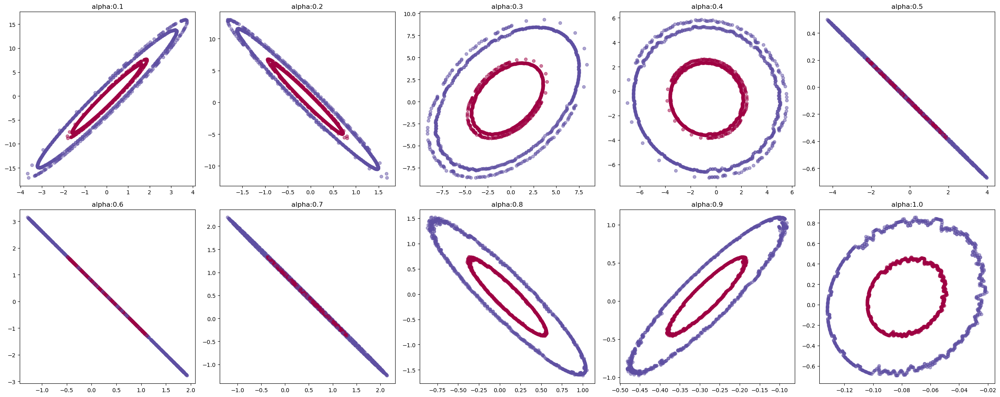

In [31]:
# row_normalized
X,c, A, dataset = get_circles(n_samples=1500, shuffle=True, noise=None, random_state= 0, factor=0.5,
                        n_neighbours = 5, features = 'coordinates', standardize=True)
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(circles['symmetric_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,0],circles['symmetric_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,1], c = c, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i+1],1)))
plt.tight_layout()
plt.show()

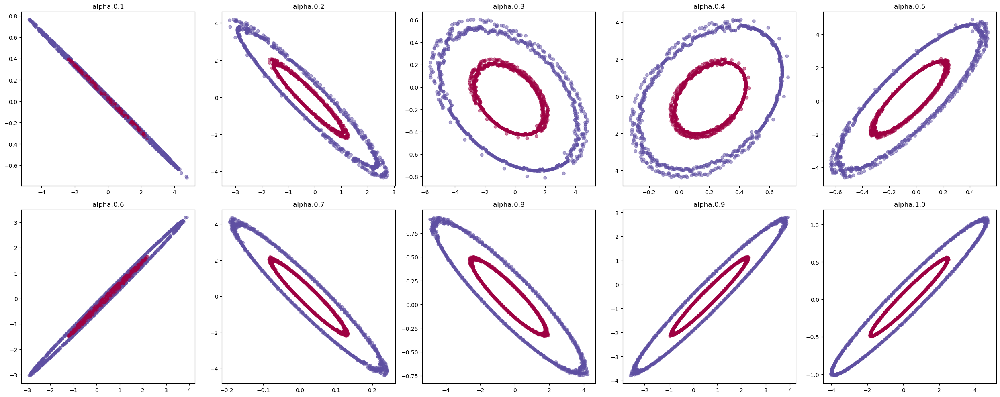

In [32]:
# row_normalized
X,c, A, dataset = get_circles(n_samples=1500, shuffle=True, noise=None, random_state= 0, factor=0.5,
                        n_neighbours = 5, features = 'coordinates', standardize=True)
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(circles['RW_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,0],circles['RW_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,1], c = c, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i+1],1)))
plt.tight_layout()
plt.show()

In [ ]:
exp = 20
moons = {}
for i in range(exp):
    X,c, A, dataset = get_moons(n_samples=1500, shuffle=True, noise=None, random_state= i, 
                        n_neighbours = 5, features = 'coordinates', standardize=True, ratio = 0.8)
    perfect_embedding = X
    alpha = np.arange(0,1.1,0.1)
    for types in ["symmetric","RW"]:
        for j in np.arange(10):
            model = train_grace(dataset, 32, 2, n_layers=1, tau=0.5,
                        epochs=500, wd=1e-3, lr=1e-1, fmr=0.2, edr =0.5,
                        proj="nonlinear-hid", name_file="test", device=None,
                        gnn_type= types, alpha=alpha[j+1], beta = 1,add_self_loops= True)
            out_tmp = model.get_embedding(dataset)
            Y = out_tmp.detach().numpy()
            _,_,cor,_ = spearman_correlation_eval(perfect_embedding, out_tmp)
            knn_eval = neighbor_kept_ratio_eval(dataset,out_tmp, n_neighbors = 5)
            dens = eval_density_preserve(X,Y, sigma = 1.0, min_dist = 1e-3)
            moons[types + '_' + str(alpha[j+1]) + '_' +  str(i)]  =  {'global_m': cor, 'local_m' : knn_eval, 'density': dens,
                                            'seed' : i,
                                            'gnn_type': types,
                                            'embedding' : out_tmp,
                                            'exp number': i,
                                            'alpha': alpha[j+1]}



=== train GRACE model ===
Epoch=000, loss=8.1147
Epoch=001, loss=7.8787
Epoch=002, loss=7.6520
Epoch=003, loss=8.2486
Epoch=004, loss=7.4339
Epoch=005, loss=7.5866
Epoch=006, loss=7.5707
Epoch=007, loss=7.3069
Epoch=008, loss=7.5155
Epoch=009, loss=8.3197
Epoch=010, loss=7.2843
Epoch=011, loss=8.2412
Epoch=012, loss=7.4997
Epoch=013, loss=8.0172
Epoch=014, loss=7.9152
Epoch=015, loss=8.1897
Epoch=016, loss=7.6282
Epoch=017, loss=7.3976
Epoch=018, loss=7.4165
Epoch=019, loss=7.7670
Epoch=020, loss=7.7491
Epoch=021, loss=8.1586
Epoch=022, loss=7.4821
Epoch=023, loss=7.9285
Epoch=024, loss=7.4977
Epoch=025, loss=7.6938
Epoch=026, loss=8.2164
Epoch=027, loss=7.5007
Epoch=028, loss=7.7606
Epoch=029, loss=7.6525
Epoch=030, loss=7.4877
Epoch=031, loss=7.4731
Epoch=032, loss=7.4569
Epoch=033, loss=7.4379
Epoch=034, loss=7.4132
Epoch=035, loss=7.3946
Epoch=036, loss=7.5828
Epoch=037, loss=7.3655
Epoch=038, loss=7.8373
Epoch=039, loss=7.3404
Epoch=040, loss=7.8696
Epoch=041, loss=7.3326
Epoch=04

In [45]:
X,c, A, dataset = get_moons(n_samples=1500, shuffle=True, noise=None, random_state= 3, 
                        n_neighbours = 5, features = 'coordinates', standardize=True)
for j in range(10):
    Y = moons['RW_'+str(alpha[j+1])+'_3']['embedding'].detach().numpy()
    dens = eval_density_preserve(X,Y, sigma = 1.0, min_dist = 1e-3)
    print(dens)

0.1135070376932127
-0.23776726424596067
0.1414259298264123
0.022650375399344586
0.2410523982960841
-0.5938323098317362
-0.10454363979722238
0.5818986249215317
0.39310625221245266
0.13679565519814102


In [ ]:
# Store data 
with open('moon-repeat-0802.pkl', 'wb') as file:
    # A new file will be created
    pickle.dump(moons, file)

In [ ]:
tab2 = pd.DataFrame.from_dict(moons).T
tab2.groupby(["gnn_type","alpha"])['global_m','local_m','density'].mean()

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_96509/3012975969.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  tab2.groupby(["gnn_type","alpha"])['global_m','local_m','density'].mean()


global_m   local_m   density
gnn_type  alpha                              
RW        0.1    0.956079  0.448132  0.930258
          0.2    0.942825  0.441622  0.939448
          0.3    0.954588  0.454212  0.963949
          0.4    0.941467  0.431328  0.926857
          0.5    0.955351  0.448646  0.949980
          0.6    0.958432  0.464684  0.966634
          0.7    0.958751  0.466198  0.944724
          0.8    0.945263  0.496189  0.954115
          0.9    0.960833  0.561193  0.953621
          1.0    0.931091  0.609417  0.910457
symmetric 0.1    0.941824  0.554968  0.881547
          0.2    0.934919  0.549702  0.916745
          0.3    0.938187  0.536768  0.921023
          0.4    0.949002  0.518359  0.955040
          0.5    0.923690  0.490541  0.929700
          0.6    0.953502  0.509117  0.955912
          0.7    0.944625  0.504498  0.941014
          0.8    0.928820  0.522436  0.935585
          0.9    0.930520  0.586371  0.919239
          1.0    0.907829  0.594564  0.873402

In [ ]:
tab2.groupby(["gnn_type","alpha"])['global_m','local_m','density'].std()

/var/folders/52/dh42902j7rv__r8tnhmqf8_w0000gn/T/ipykernel_96509/2556064042.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  tab2.groupby(["gnn_type","alpha"])['global_m','local_m','density'].std()


global_m   local_m   density
gnn_type  alpha                              
RW        0.1    0.055600  0.041819  0.065110
          0.2    0.062826  0.040827  0.060372
          0.3    0.048732  0.026202  0.032384
          0.4    0.071609  0.075994  0.114612
          0.5    0.056001  0.052783  0.064251
          0.6    0.049672  0.025269  0.041721
          0.7    0.056022  0.046192  0.071572
          0.8    0.066207  0.047814  0.049451
          0.9    0.049127  0.061973  0.085675
          1.0    0.069337  0.075923  0.121573
symmetric 0.1    0.062022  0.016949  0.029520
          0.2    0.057997  0.012586  0.027581
          0.3    0.054432  0.020922  0.070963
          0.4    0.073188  0.068185  0.034435
          0.5    0.066579  0.076553  0.072111
          0.6    0.049131  0.034804  0.055567
          0.7    0.059315  0.044894  0.085064
          0.8    0.074601  0.089095  0.061804
          0.9    0.074135  0.074423  0.060034
          1.0    0.067789  0.101444  0.068767

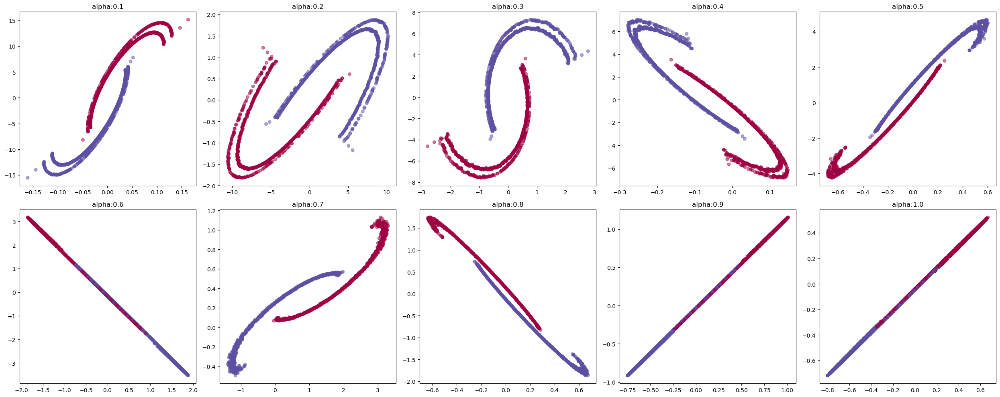

In [16]:
# row_normalized
X,c, A, dataset = get_moons(n_samples=1500, shuffle=True, noise=None, random_state= 0, 
                        n_neighbours = 5, features = 'coordinates', standardize=True)
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(moons['symmetric_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,0],moons['symmetric_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,1], c = c, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i+1],1)))
plt.tight_layout()
plt.show()

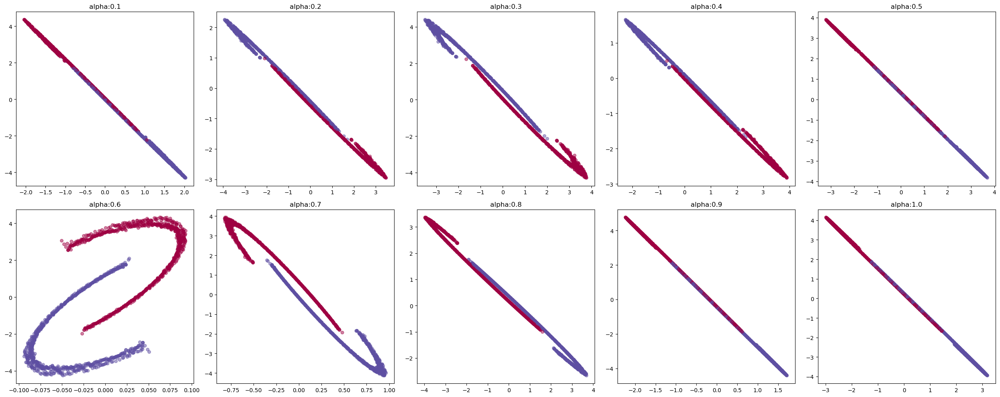

In [15]:
# row_normalized
X,c, A, dataset = get_moons(n_samples=1500, shuffle=True, noise=None, random_state= 0, 
                        n_neighbours = 5, features = 'coordinates', standardize=True)
num = 10
num_row = 2
num_col = 5
fig, axes = plt.subplots(num_row, num_col, figsize=(5*num_col,5*num_row))
for i in range(num):
    ax = axes[i // num_col, i % num_col]
    _ = ax.scatter(moons['RW_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,0],moons['RW_'+str(alpha[i+1])+'_0']['embedding'].detach().numpy()[:,1], c = c, cmap = plt.cm.Spectral_r, s = 30, alpha = 0.5)
    _ = ax.set_title('alpha:' + str(round(alpha[i+1],1)))
plt.tight_layout()
plt.show()

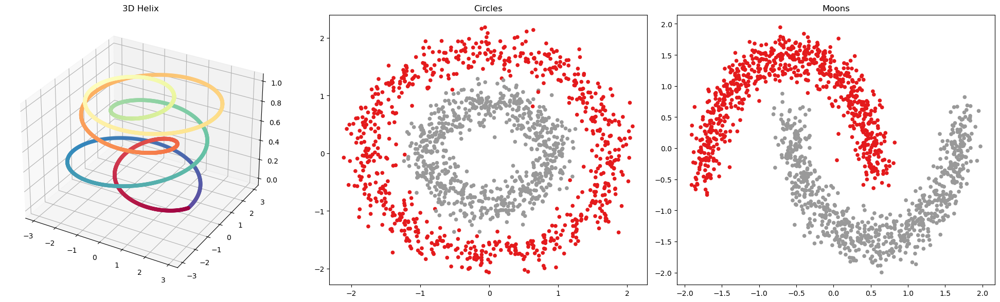

In [74]:
x,y,z,t, A,new_data = get_vhelix(uniform = True, n_samples = 5000)

X,c, _, _  = get_circles(n_samples=1500, shuffle=True, noise=0.1, random_state= 0,factor=0.5,
                        n_neighbours = 5, features = 'coordinates', standardize=True)


Y,d, _, _ = get_moons(n_samples=1500, shuffle=True, noise=0.1, random_state= 0,
                        n_neighbours = 5, features = 'coordinates', standardize=True)


# plotting
fig = plt.figure(figsize = (20,6))
ax = fig.add_subplot(131, projection='3d')
ax.scatter(x,y,z, cmap = plt.cm.Spectral_r, c = t, s= 20)
ax.set_title('3D Helix')
ax = fig.add_subplot(132)
ax.scatter(X[:,0], X[:,1], c=c, cmap = 'Set1', s = 20)
ax.set_title('Circles')
ax = fig.add_subplot(133)
ax.scatter(Y[:,0], Y[:,1], c=d, cmap ='Set1', s = 20)
ax.set_title('Moons')
plt.tight_layout()
plt.show()  # show train_acc and test_acc together
